## Data and Library Preparation

In [1]:
import tensorflow as tf
from pathlib import Path
!pip install -q jmd_imagescraper
from jmd_imagescraper.core import *
import glob
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
root = Path().cwd()/"images"

duckduckgo_search(root, "Cats", "cute kittens", max_results=8)
duckduckgo_search(root, "Dogs", "cute puppies", max_results=8)

Duckduckgo search: cute kittens


Duckduckgo search: cute puppies


[PosixPath('/content/images/Dogs/001_de341549.jpg'),
 PosixPath('/content/images/Dogs/002_f57388ee.jpg'),
 PosixPath('/content/images/Dogs/003_c4515ee6.jpg'),
 PosixPath('/content/images/Dogs/004_b7721db2.jpg'),
 PosixPath('/content/images/Dogs/005_46e964e7.jpg'),
 PosixPath('/content/images/Dogs/006_f4fae95a.jpg'),
 PosixPath('/content/images/Dogs/007_de09b314.jpg'),
 PosixPath('/content/images/Dogs/008_46d893c6.jpg')]

In [3]:
cats_files = glob.glob('/content/images/Cats/*')
dogs_files = glob.glob('/content/images/Dogs/*')

for cf in cats_files:
  num = cf.split('/')[-1].split('_')[0]
  os.rename(cf,f'/content/images/Cats/cat_{num}.jpg')
for df in dogs_files:
  num = df.split('/')[-1].split('_')[0]
  os.rename(df,f'/content/images/Dogs/dog_{num}.jpg')

In [4]:
cats_files = glob.glob('/content/images/Cats/*')
dogs_files = glob.glob('/content/images/Dogs/*')

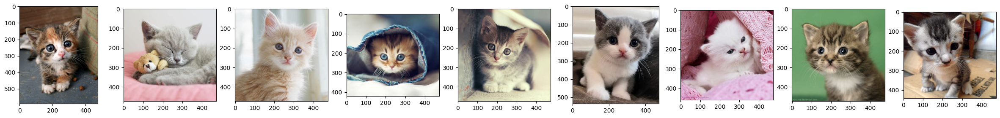

In [5]:
fig,ax = plt.subplots(ncols=len(cats_files),figsize=(30,3))
for i in range(len(cats_files)):
  cat = plt.imread(cats_files[i])
  ax[i].imshow(cat)

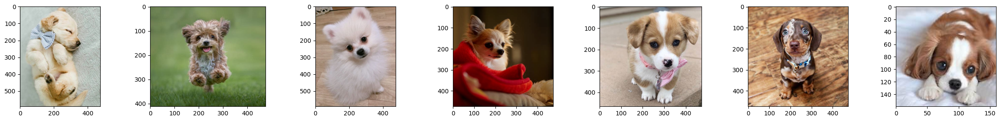

In [6]:
fig,ax = plt.subplots(ncols=len(dogs_files),figsize=(30,3))
for i in range(len(dogs_files)):
  dog = plt.imread(dogs_files[i])
  ax[i].imshow(dog)

# Loading Image Data in Tensorflow

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*_Qs5j9GbBrL-eGflY2AKFQ.png"></img>

Sumber: [tds](https://towardsdatascience.com/what-is-the-best-input-pipeline-to-train-image-classification-models-with-tf-keras-eb3fe26d3cc5)

## Image Data Generator from directory

In [7]:
IMG_SIZE = 400
path = '/content/images/'

datagen = tf.keras.preprocessing.image.ImageDataGenerator()
data = datagen.flow_from_directory(path, (IMG_SIZE, IMG_SIZE), batch_size=32, class_mode='binary', shuffle=False) #class_mode = categorical for multiclass

Found 16 images belonging to 2 classes.


In [8]:
data

In [9]:
data.next()

(array([[[[ 78.,  77.,  83.],
          [ 76.,  75.,  81.],
          [ 73.,  72.,  78.],
          ...,
          [161., 166., 160.],
          [165., 170., 164.],
          [165., 170., 164.]],
 
         [[ 78.,  77.,  83.],
          [ 75.,  74.,  80.],
          [ 72.,  71.,  77.],
          ...,
          [158., 163., 157.],
          [161., 166., 160.],
          [161., 166., 160.]],
 
         [[ 78.,  75.,  82.],
          [ 75.,  72.,  79.],
          [ 72.,  69.,  76.],
          ...,
          [155., 160., 154.],
          [158., 163., 157.],
          [158., 163., 157.]],
 
         ...,
 
         [[207., 209., 185.],
          [204., 206., 182.],
          [202., 204., 180.],
          ...,
          [227., 228., 196.],
          [244., 245., 213.],
          [244., 245., 213.]],
 
         [[207., 207., 183.],
          [214., 214., 190.],
          [207., 207., 183.],
          ...,
          [245., 246., 214.],
          [251., 252., 220.],
          [242., 243., 211.

In [10]:
data.next()[0].shape

(16, 400, 400, 3)

In [11]:
data.next()[0][0]

array([[[ 78.,  77.,  83.],
        [ 76.,  75.,  81.],
        [ 73.,  72.,  78.],
        ...,
        [161., 166., 160.],
        [165., 170., 164.],
        [165., 170., 164.]],

       [[ 78.,  77.,  83.],
        [ 75.,  74.,  80.],
        [ 72.,  71.,  77.],
        ...,
        [158., 163., 157.],
        [161., 166., 160.],
        [161., 166., 160.]],

       [[ 78.,  75.,  82.],
        [ 75.,  72.,  79.],
        [ 72.,  69.,  76.],
        ...,
        [155., 160., 154.],
        [158., 163., 157.],
        [158., 163., 157.]],

       ...,

       [[207., 209., 185.],
        [204., 206., 182.],
        [202., 204., 180.],
        ...,
        [227., 228., 196.],
        [244., 245., 213.],
        [244., 245., 213.]],

       [[207., 207., 183.],
        [214., 214., 190.],
        [207., 207., 183.],
        ...,
        [245., 246., 214.],
        [251., 252., 220.],
        [242., 243., 211.]],

       [[207., 207., 183.],
        [214., 214., 190.],
        [207., 2

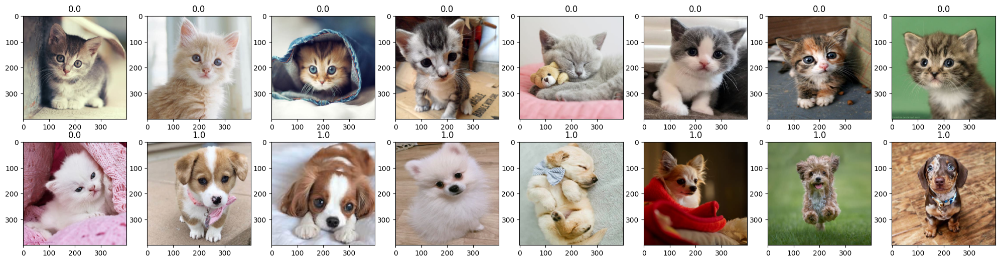

In [12]:
fig,ax = plt.subplots(nrows=2,ncols=8,figsize=(25,6))
n=0
for i in range(2):
  for j in range(8):
    img = data.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(data.next()[1][n])
    n+=1

In [13]:
data.class_indices

{'Cats': 0, 'Dogs': 1}

In [14]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.2)
train = imgen.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)
val = imgen.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',shuffle=False)

Found 14 images belonging to 2 classes.
Found 2 images belonging to 2 classes.


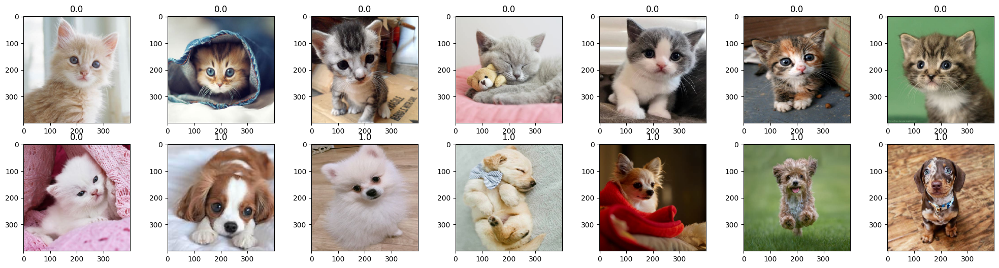

In [17]:
fig,ax = plt.subplots(nrows=2,ncols=7,figsize=(25,6))
n=0
for i in range(2):
  for j in range(7):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

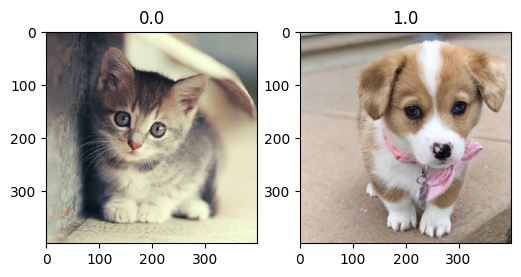

In [20]:
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(6,6))
n=0
for i in range(2):
  img = val.next()[0][n].astype('uint8')
  ax[i].imshow(img)
  ax[i].set_title(val.next()[1][n])
  n+=1

### flow from dataframe

In [25]:
import pandas as pd

imgs = cats_files+dogs_files
labels = ['cats' for i in range(len(cats_files))]+['dogs' for i in range(len(dogs_files))]
data = pd.DataFrame({'images':imgs,'label':labels})
data = data.sample(len(data)).reset_index(drop=True)
data

,images,label
0,/content/images/Cats/cat_007.jpg,cats
1,/content/images/Dogs/dog_dog.jpg,dogs
2,/content/images/Cats/cat_003.jpg,cats
3,/content/images/Dogs/dog_005.jpg,dogs
4,/content/images/Cats/cat_004.jpg,cats
5,/content/images/Cats/cat_006.jpg,cats
6,/content/images/Dogs/dog_003.jpg,dogs
7,/content/images/Dogs/dog_002.jpg,dogs
8,/content/images/Cats/cat_cat.jpg,cats
9,/content/images/Dogs/dog_004.jpg,dogs


In [27]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.25) #validation_split is 0.25 only to make the division even
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)
val = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',shuffle=False)

Found 12 validated image filenames belonging to 2 classes.
Found 4 validated image filenames belonging to 2 classes.


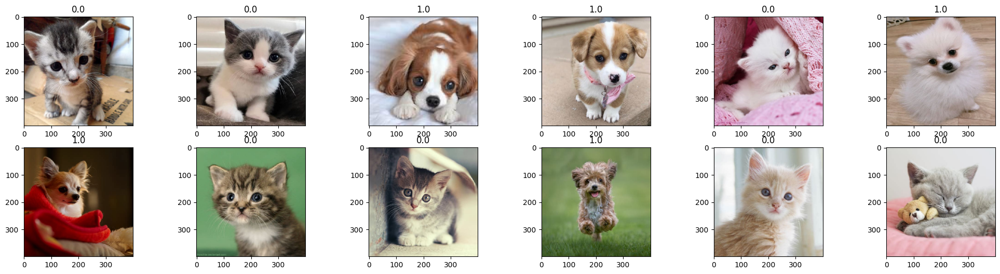

In [29]:
fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

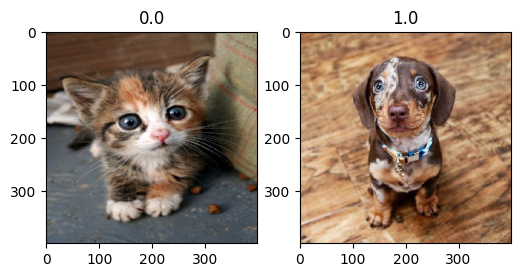

In [30]:
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(6,6))
n=0
for i in range(2):
  img = val.next()[0][n].astype('uint8')
  ax[i].imshow(img)
  ax[i].set_title(val.next()[1][n])
  n+=1

## Data Augmentatation

### Horizontal Flip

Found 12 validated image filenames belonging to 2 classes.


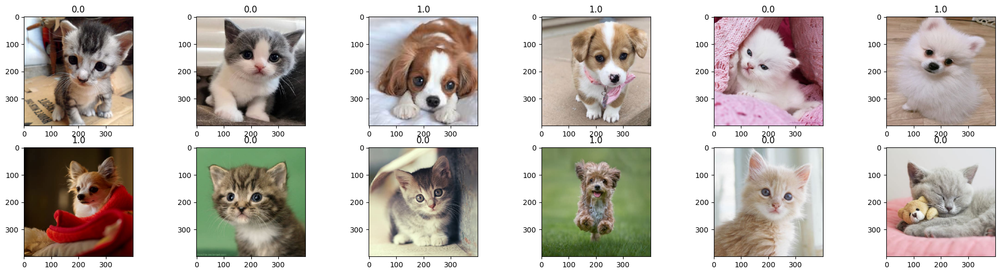

In [31]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Vertical Flip

Found 12 validated image filenames belonging to 2 classes.


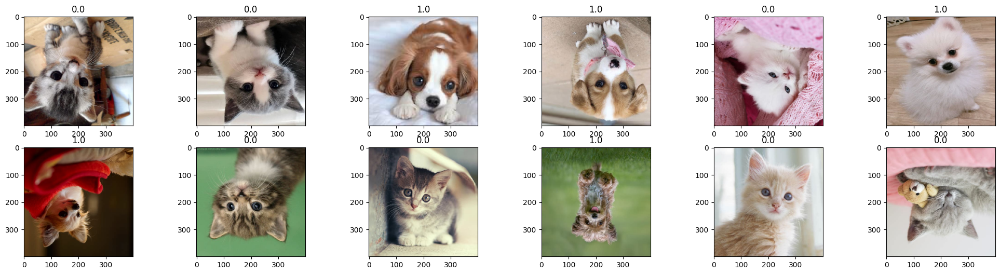

In [32]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Width Shift

Found 12 validated image filenames belonging to 2 classes.


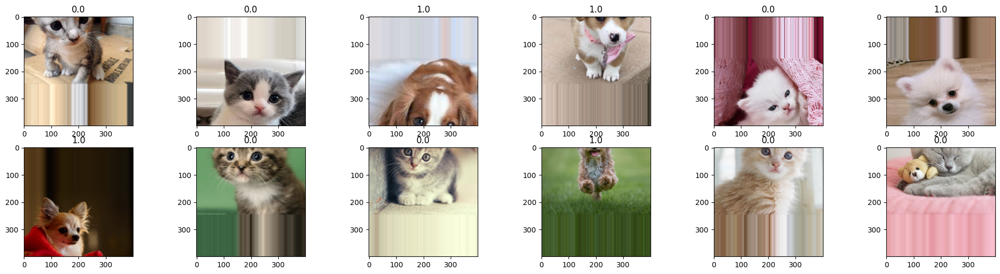

In [33]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-150, 150],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Height Shift

Found 12 validated image filenames belonging to 2 classes.


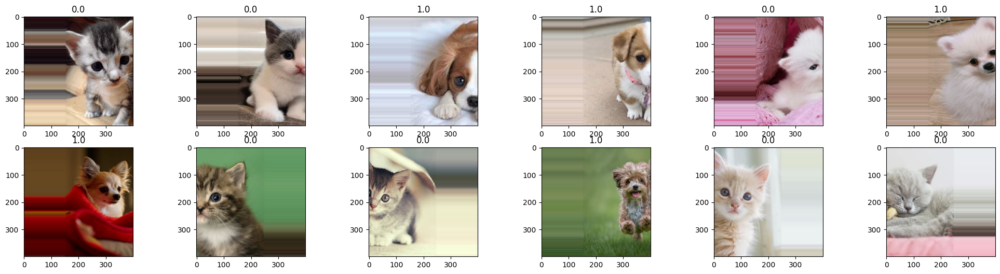

In [34]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range=[-150, 150],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Rotation

Found 12 validated image filenames belonging to 2 classes.


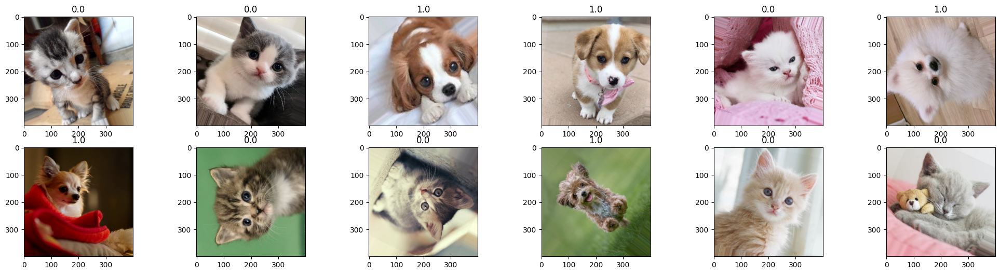

In [35]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=120,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Zoom

Found 12 validated image filenames belonging to 2 classes.


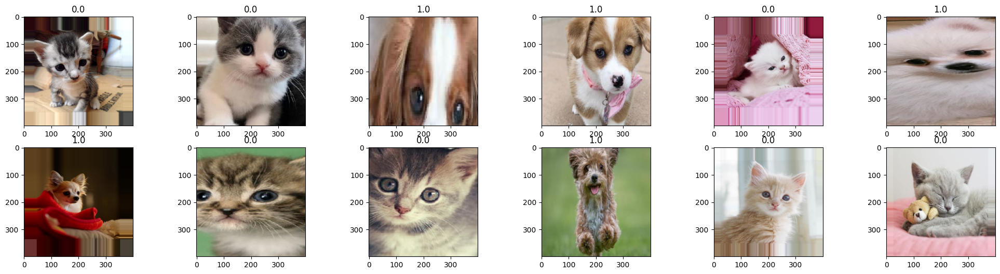

In [36]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(zoom_range=[0.3, 1.5],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Shear

Found 12 validated image filenames belonging to 2 classes.


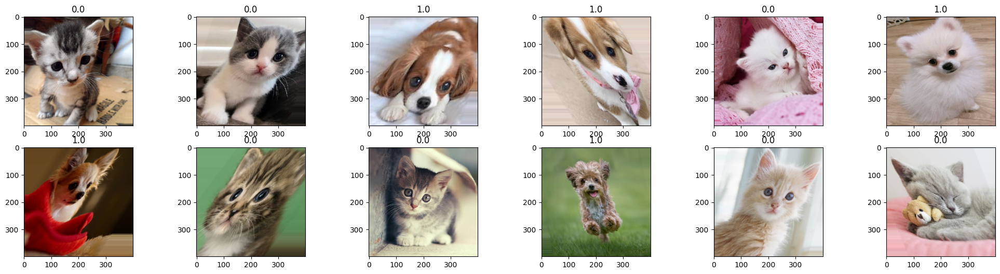

In [37]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=50,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Combining All Together

Found 12 validated image filenames belonging to 2 classes.


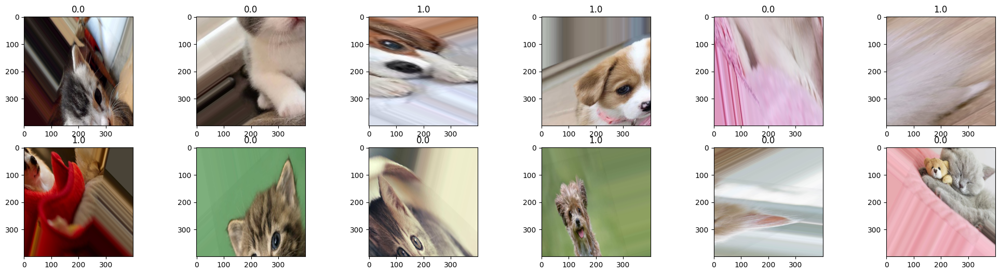

In [38]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-100, 100],
                                                        height_shift_range=[-100, 100],
                                                        rotation_range=120,
                                                        zoom_range = [0.3, 1.5] ,
                                                        shear_range=50,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1